# Minimizing functions - how a computer learns

In the previous notebooks, we've seen that by changing **parameters** in a function, we could find a "best fit" of that function to some data. We use a **loss function** to quantify the "goodness" of a set of parameters and we look for those parameters that **optimize**, in fact **minimize**, the loss function. If we teach a machine how to minimize the loss function on its own, we say that machine is able to **learn** how to model our data.

In the last notebook, we threw around terms like **derivative**, **gradient**, and **gradient descent** to give you a rough sense of how we minimize a function on a computer. In this notebook, we will step through these concepts more carefully, with the aim of being able to implement them using Julia.

## Minimizing a 1D function using calculus

Let's draw the 1D loss function $L_1$ from a previous notebook again:

In [1]:
σ(x) = 1 / (1 + exp(-x))
f(x, w) = σ(w * x)

x1 = 2
y1 = 0.8

L1(w) = (y1 - f(x1, w))^2

L1 (generic function with 1 method)

In [2]:
using Plots; gr()
using Interact

HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/d3a399565bb4a0e8920cf78774b1f4e7d964969b-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/d3a399565bb4a0e8920cf78774b1f4e7d964969b-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

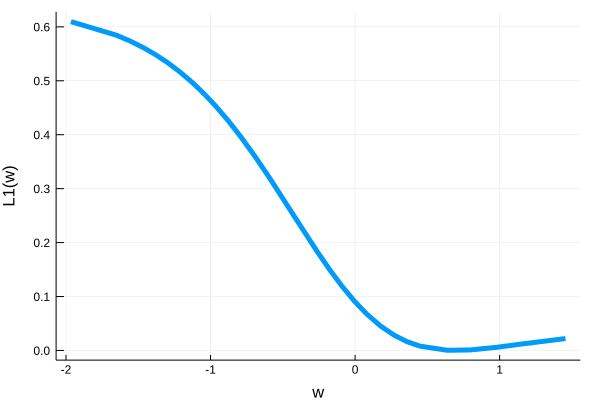

In [3]:
plot(L1, -2, 1.5, xlabel="w", ylabel="L1(w)", leg=false, lw=5)

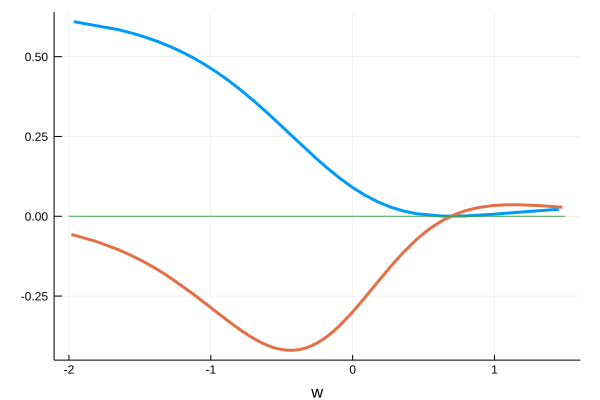

In [4]:
σ(x) = 1 / (1 + exp(-x))
f(x, w) = σ(w * x)
h = 0.001
x1 = 2
y1 = 0.8

L1(w) = (y1 - f(x1, w))^2 
L1_dev(w) = (L1(w+h) - L1(w))/h
plot(L1, -2, 1.5, xlabel="w", label="L1(w)", leg=false, lw=3)
plot!(L1_dev, -2, 1.5, xlabel="w", label="L1'(w)", leg=false, lw=3) 
plot!(collect(-2:0.01:1.5), zeros(size(collect(-2:0.01:1.5))))

# L1_pred(w) = y1 + L1_dev(w) * x1
# @manipulate for w in -2:0.01:1.5
#     plot!(L1_pred, -2, 1.5, lw=3)
# end

By eye, we can see that the minimum is around $w=0.6$. But how can we get the computer to work this out on its own?

In the previous notebook, we thought of this function plot as a hill, viewed from the side. We could find the minimum by making the hill sticky, and letting a ball roll down it. The ball will find and settle in the minimum of the function.  Now let's see how to teach a computer to do this.

We need to find the downhill direction along the hill, which is related to its *slope* (how steep it is). Calculus provides us with tools to calculate that slope!

Namely, the slope of a curve $L_1(w)$ at $w$ is given by its **derivative** $L_1'(w)$; geometrically, this is the slope of the **tangent line** to the curve at that point, i.e. the straight line which touches the curve at that point.

Calculus provides us with some rules to calculate an analytical formula for the derivative, and we will see later how to apply these rules, albeit indirectly, for machine learning. 
To gain understanding, however, we will see here how to get the computer to help us out by calculating the derivatives numerically instead!

## Approximating derivatives

Let's recall that the derivative $L_1'(w)$ of a function is defined as

$$L_1'(w) \simeq \frac{L_1(w+h) - L_1(w)}{h},$$

for a small step size $h$. (Strictly speaking, we must take the limit when $h$ tends to $0$ to obtain the exact value of the derivative.)

#### Exercise 1

Write a function to calculate the derivative of a function at a given point. Note that in Julia, we can easily pass functions as arguments to other functions!
The function should take the function, the point $w$ at which to calculate the derivative, and the value of $h$, which should have a default value of 0.001.

*Note*: A function input argument can have a *default value* if we set the input argument equal to that default value when we define the function. For example,

```julia
f(x, a = 3) = a * x^2
```

The function `f` will square the input we give it and multiply by `a`. However,  if we choose to call `f(x)` *without* passing it an `a` input, it will assume `a` is `3` and return `3*x^2`.

In [5]:
f(x, a = 3) = a * x^2 

f_dev(x) = (f(x+h) - f(x))/h

f_dev (generic function with 1 method)

#### Exercise 2

Write an interactive visualization of the tangent line to the graph of $L_1$, so that we can visualize the tangent at any point on $L_1$. Include the current value of the derivative in the title.

*Hint*: Recall that the straight line through the point $(x_0, y_0)$ with slope $m$ is given by

$$ \frac{y - y_0}{x - x_0} = m,$$

so 

$$y = y_0 + m*(x - x_0).$$

In [6]:
σ(x) = 1 / (1 + exp(-x))
f(x, w) = σ(w * x)

x1 = 2
y1 = 0.8

L1(w) = (y1 - f(x1, w))^2 
L1_dev(w) = (L1(w+h) - L1(w))/h 
L1_p(x, w) = L1(w) + L1_dev(w) * (x - w)
@manipulate for w in -2:0.01:1.5
    plot(L1, -2, 1.5, xlabel="w", label="L1(w)", lw=3)
    scatter!([w], [L1(w)], label="x_0, y_0")
    #plot!(x->(L1(w)+L1_dev(w)*(x-w)), -2, 1.5, xlabel="w", label="L1(w)", leg=false, lw=3)
    plot!(x->L1_p(x,w), -2, 1.5, xlabel="w", label="L1_p(w)", lw=3)
    title!("L'($w) = $(L1_dev(w))")
end

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:w=>Widget{:slider,Float64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_05", 0, Any[SyncCallback(Scope("knockout-component-8871fc79-89ef-4ee5-ae72-0c57f3817bfa", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["w"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>351,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: formatted_value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("formatted_vals"=>(Observable{Any}("ob_03", ["-2.0", "-1.99", "-1.98", "-1.97", "-1.96", "-1.95", "-1.94", "-1.93", "-1.92", "-1.91"  …  "1.41", "1.42", "1.43", "1.44", "1.45", "1.46", "1.47", "1.48", "1.49", "1.5"], Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "formatted_vals")))]), nothing),"changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"formatted_value"=>(Observable{String}("ob_04", "-0.25", Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "formatted_value")))]), nothing),"index"=>(Observable{Any}("ob_02", 176, Any[##25#28{##70#73,Observable{Float64},Array{Function,1}}(##70#73(Box(-2.0:0.01:1.5)), Observable{Float64}("ob_01", -0.25, Any[##24#27{##68#71,Observable{Any},Array{Function,1}}(##68#71(Box(-2.0:0.01:1.5)), Observable{Any}(#= circular reference @-6 =#), Function[##24#27{##68#71,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##70#73,Observable{Float64},Array{Function,1}}(#= circular reference @-5 =#)]), #g#15{##16#17{##3#6,Observable{Any}},Tuple{Observable{Float64}}}(##16#17{##3#6,Observable{Any}}(##3#6(), Observable{Any}("ob_06", Plot{Plots.GRBackend() n=3}, Any[])), (Observable{Float64}(#= circular reference @-4 =#),))]), Function[##24#27{##68#71,Observable{Any},Array{Function,1}}(##68#71(Box(-2.0:0.01:1.5)), Observable{Any}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#]), ##25#28{##70#73,Observable{Float64},Array{Function,1}}(#= circular reference @-2 =#)]), SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "index")))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/hm0/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/hm0/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/hm0/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/hm0/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/hm0/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("formatted_vals"=>Any[JSString("(function (val){return (val!=this.model[\"formatted_vals\"]()) ? (this.valueFromJulia[\"formatted_vals\"]=true, this.model[\"formatted_vals\"](val)) : undefined})")],"_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll();\n    k

#### Exercise 3

What is the value of the derivative (slope of the tangent line) at a minimum? Can this happen anywhere else?

<font color="red"> $L'(0.69) = -0.0005447598109495935$ </font>

## Minimization by gradient descent

The tangent line at a point is a good approximation of the function near that point. Therefore the derivative tells us in which direction, and how fast, a function grows or shrinks when we move a small distance away from that point. 

As we saw in the previous notebook, we can think of the function as being a hill, and having a ball that we want to move down the hill. Gravity will automatically pull the ball in the direction *down* the hill; we want to emulate this in the computer!

#### Exercise 4

When the derivative $L_1'(w)$ is positive, that means that $L_1$ increases from left to right at point $w$.

If the derivative $L_1'(w)$ is positive (> 0), in which direction should we move $w$ to *decrease* $L_1$?

<font color="red"> From right to left. </font>

#### Exercise 5

If the derivative $L_1'(w)$ is negative (< 0), in which direction should we move $w$ to *decrease* $L_1$?

<font color="red"> From left to right. </font>

We can use this information to tell the computer which way to take a step. This constitutes the numerical algorithm called **gradient descent**; it is called this since we are descending (moving downwards) along the graph of the function by using information about its gradient (slope).

#### Exercise 6

Implement gradient descent by following this prescription for an **iterative (repetitive) algorithm**:

1. Start at an initial guess $w_0$ for $w$. 

2. At each step, calculate the derivative, $L_1'(w_n)$ at the current value of $w_n$ using the function that you created above.

3. Modify the value of $w$ by a small multiple (for example, $\eta=0.01$) of the value of the derivative you just created, via $w_{n+1} = w_n - \eta L_1'(w_n)$.

For this problem, start with $w_0 = -2.0$. Repeat steps 2 and 3 a total of `2000` times.

Package this code into a function called `gradient_descent` that takes two inputs, a function and a range for values of $w$, and returns the final value of $w$ and $L_1(w)$.

Using `L1` and `-2:0.01:1.5` as your inputs to `gradient_descent`, for what value of $w$ is $L_1$ at a minimum?

In [7]:
function gradient_descent(f::Function, w)
#     make an initial guess
    η = 0.01
    f_dev(w) = (f(w + η) - f(w)) / η
    w = -2.0
    for iter in 1:20000        
        w = w - f_dev(w) * η 
        if iter % 1000 == 0 
            println("$iter, $w, $(f(w)), $(f_dev(w))")
        end
    end
    return w, f(w)
end

gradient_descent(L1, -2:0.01:1.5)            

1000, -0.41262908586996394, 0.24537297247993448, -0.4195599164686675
2000, 0.6348391785897624, 0.0003729655881599626, -0.011992475709032384
3000, 0.6818349643558261, 1.3282307981836978e-5, -0.0013105706482745552
4000, 0.6873557047933837, 3.4585352143129194e-6, -0.00016540057237256342
5000, 0.6880584936902909, 2.6678409513918973e-6, -2.1238324294143038e-5
6000, 0.6881488350286707, 2.5736771721158235e-6, -2.733137307622399e-6
7000, 0.6881604626058935, 2.561681233770054e-6, -3.518243019772555e-7
8000, 0.6881619593981709, 2.5601390710333077e-6, -4.529039143790311e-8
9000, 0.6881621520809019, 2.559940581677965e-6, -5.830265730428699e-9
10000, 0.688162176885101, 2.5599150305498615e-6, -7.505347779036055e-10
11000, 0.688162180078165, 2.5599117413425994e-6, -9.661710946303837e-11
12000, 0.6881621804892116, 2.5599113179193807e-6, -1.2437515261269757e-11
13000, 0.6881621805421255, 2.559911263412105e-6, -1.6011092378000668e-12
14000, 0.6881621805489374, 2.5599112563949067e-6, -2.060893417591336e-

(0.6881621805499167, 2.5599112553863085e-6)

#### Exercise 7

Modify your code for gradient descent to return the result once it has found an answer within some *tolerance*, rather than taking a set number of steps. The new prescription for this algorithm is:

1. Start at an initial guess $w_0$ for $w$. 

2. At each step, calculate the derivative, $L_1'(w_n)$ at the current value of $w_n$, using the function that you created above.

3. Modify the value of $w$ by a small multiple (for example, $\eta=0.01$) of the value of the derivative you just created, via $w_{n+1} = w_n - \eta L_1'(w_n)$.

4. Check how different $w_{n+1}$ is from $w_n$. If you're satisfied that $L_1(w_{n+1})$ is minimized, return $w_{n+1}$ and $L_1(w_{n+1})$. Otherwise, go to step (2) and continue.

Edit `gradient_descent` so that it takes three inputs: a function, a range for values of $w$, and a tolerance that tells you how close $w_{n+1}$ must be to $w_n$ before you can stop iterating. 

Using `L1`, `-2:0.01:1.5`, and `.000001` as your inputs to `gradient_descent`, for what value of $w$ is $L_1$ at a minimum?

In [8]:
function gradient_descent(f::Function, w, tol)
#     make an initial guess
    η = 0.01
    f_dev(w) = (f(w + η) - f(w)) / η
    w = -2.0
    for iter in 1:20000        
        w = w - f_dev(w) * η 
        if abs(f_dev(w) * η) < tol
            println("$iter, $w, $(f(w)), $(f_dev(w))")
            return w, f(w)
        end
        if iter % 1000 == 0 
            println("$iter, $w, $(f(w)), $(f_dev(w))")
        end
    end
    return w, f(w)
end

gradient_descent(L1, -2:0.01:1.5, .000001) 

1000, -0.41262908586996394, 0.24537297247993448, -0.4195599164686675
2000, 0.6348391785897624, 0.0003729655881599626, -0.011992475709032384
3000, 0.6818349643558261, 1.3282307981836978e-5, -0.0013105706482745552
4000, 0.6873557047933837, 3.4585352143129194e-6, -0.00016540057237256342
4245, 0.6876744116411301, 3.087182639320568e-6, -9.997946485321435e-5


(0.6876744116411301, 3.087182639320568e-6)

#### Exercise 8

Alter the function `gradient_descent` so that it stores the results `(w, L1(w))` at each step of the algorithm as an array and returns this array. How many steps does the algorithm take for input parameters `(L1, -2:0.01:1.5, .000001)` before terminating? You should count your starting $w_0$ as your first step.

In [9]:
function gradient_descent(f::Function, w, tol)
    η = 0.01
    f_dev(w) = (f(w + η) - f(w)) / η
    w = -2.0
    iter_result = [0.0 w f(w) f_dev(w);]
    for iter in 1:20000 
        w = w - f_dev(w) * η 
        iter_result = vcat(iter_result, [iter w f(w) f_dev(w)])
        if abs(f_dev(w) * η) < tol
            println("$iter, $w, $(f(w)), $(f_dev(w))")
            return iter_result
        end
        if iter % 1000 == 0 
            println("$iter, $w, $(f(w)), $(f_dev(w))")
        end
    end
    return iter_result
end

iter_result = gradient_descent(L1, -2:0.01:1.5, .000001) 

1000, -0.41262908586996394, 0.24537297247993448, -0.4195599164686675
2000, 0.6348391785897624, 0.0003729655881599626, -0.011992475709032384
3000, 0.6818349643558261, 1.3282307981836978e-5, -0.0013105706482745552
4000, 0.6873557047933837, 3.4585352143129194e-6, -0.00016540057237256342
4245, 0.6876744116411301, 3.087182639320568e-6, -9.997946485321435e-5


4246×4 Array{Float64,2}:
    0.0  -2.0       0.611546    -0.0557731  
    1.0  -1.99944   0.611515    -0.0558317  
    2.0  -1.99888   0.611484    -0.0558904  
    3.0  -1.99833   0.611453    -0.0559492  
    4.0  -1.99777   0.611422    -0.0560081  
    5.0  -1.99721   0.611391    -0.0560671  
    6.0  -1.99664   0.61136     -0.0561263  
    7.0  -1.99608   0.611328    -0.0561856  
    8.0  -1.99552   0.611297    -0.056245   
    9.0  -1.99496   0.611266    -0.0563045  
   10.0  -1.9944    0.611234    -0.0563642  
   11.0  -1.99383   0.611203    -0.0564239  
   12.0  -1.99327   0.611171    -0.0564838  
    ⋮                                       
 4234.0   0.687663  3.0998e-6   -0.000102264
 4235.0   0.687664  3.09864e-6  -0.000102054
 4236.0   0.687665  3.09748e-6  -0.000101845
 4237.0   0.687666  3.09633e-6  -0.000101636
 4238.0   0.687667  3.09517e-6  -0.000101427
 4239.0   0.687668  3.09403e-6  -0.000101219
 4240.0   0.687669  3.09288e-6  -0.000101011
 4241.0   0.68767   3.09173e-6

#### Exercise 9

Overlay the steps taken in the last exercise with a plot of $L_1(w)$ vs. $w$.

Where does our algorithm take the largest steps? (Where does the ball move fastest down the hill?)

A) Between w = -2:-1<br>
B) Between w = -1:0<br>
C) Between w = 0:.6

*Hint*: It may be easier to see what's going on if you only plot, for example, every 15th step.

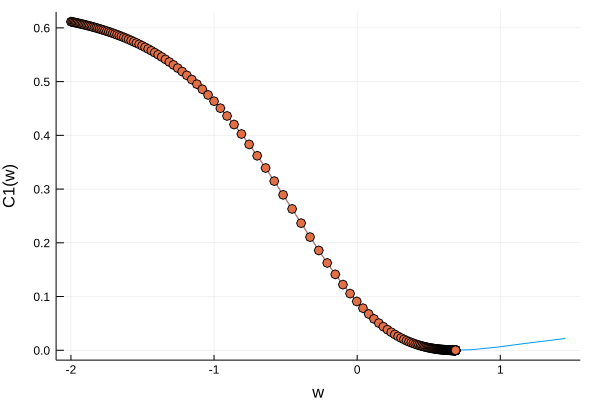

In [10]:
plot(L1, -2, 1.5, xlabel="w", ylabel="C1(w)", leg=false)
plot!(iter_result[1:15:end,2], iter_result[1:15:end,3], marker=:o)

B) The following code generates the desired figure:

```julia
wsteps = gradient_descent(C1, -2:0.01:1.5, .000001)
fig1 = plot(C1, -2, 1.5, xlabel="w", ylabel="C1(w)", leg=false)
for step in wsteps[1:15:end]
   scatter!([step[1]], [step[2]]) 
end
display(fig1)
```

1000, -0.41262908586996394, 0.24537297247993448, -0.4195599164686675
2000, 0.6348391785897624, 0.0003729655881599626, -0.011992475709032384
3000, 0.6818349643558261, 1.3282307981836978e-5, -0.0013105706482745552
4000, 0.6873557047933837, 3.4585352143129194e-6, -0.00016540057237256342
4245, 0.6876744116411301, 3.087182639320568e-6, -9.997946485321435e-5


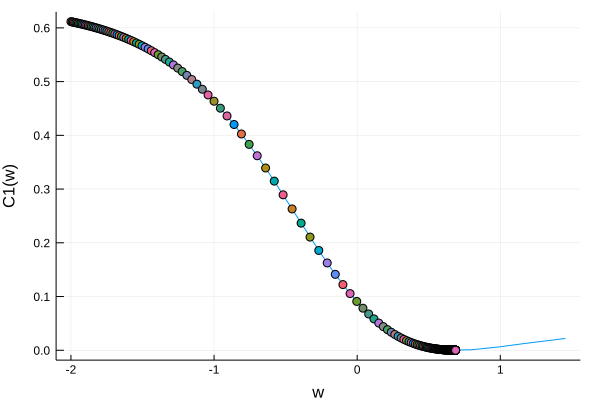

In [11]:
wsteps = gradient_descent(L1, -2:0.01:1.5, .000001)
fig1 = plot(L1, -2, 1.5, xlabel="w", ylabel="C1(w)", leg=false)
for step in 1:15:size(wsteps, 1)
   scatter!([wsteps[step, 2]], [wsteps[step, 3]]) 
end
plot!()

## Functions of 2 variables and their derivatives

So far, we have been looking at the minimizing a loss function $L_1(w)$ that depends on a single parameter, $w$. Now let's turn to the cost function $L_2(w, b)$ from a previous notebook, that is a function of *two* parameters, $w$ and $b$, and try to minimize it.

As we've seen, we get a **surface**, instead of a curve, when we graph $L_2$ as a function of both of its parameters.

**Exercise 10** 

Draw a surface plot of $L_2$, given by

$$L_{2}(w, b) = \sum_i(y_i - g(x_i, w, b))^2$$

using the `surface` function from `Plots.jl`. For this plot, use the values of `xs` and `ys` from notebook 5:

```julia
xs = [2, -3, -1, 1]
ys = [0.8, 0.3, 0.4, 0.4]
```

We can get a nice interactive 3D plot by using the Plotly backend of `Plots.jl` by executing the command 

    plotly()

In [12]:
xs = [2, -3, -1, 1]
ys = [0.8, 0.3, 0.4, 0.4]
L2(w, b) = sum((ys - (xs .* w .+ b)).^2.0)

L2 (generic function with 1 method)

In [13]:
pyplot()

Plots.PyPlotBackend()

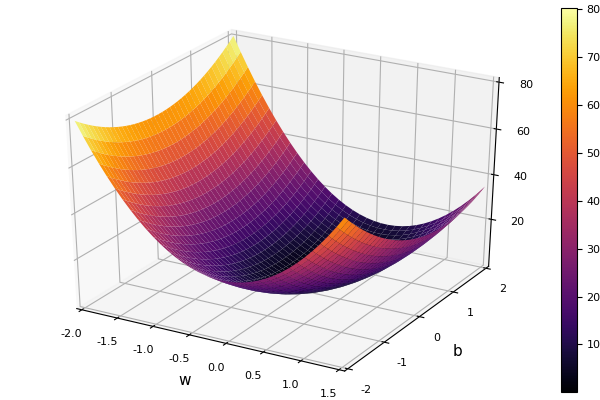

In [14]:
surface(-2:0.1:1.5, -2:0.1:2, L2, xlabel="w", ylabel="b")

### Finding the minimum

We can just about see, by rotating the graph, that $L_2$ has a single minimum. We want to find the values of $w$ and $b$ where this minimum value is reached.

Following what we did for the function $L_1$ above, we expect that we will need to calculate derivatives of $L_2$. Since the function is more complicated, though, the derivatives are too!

It turns out that the right concept is that of the [**gradient**](https://en.wikipedia.org/wiki/Gradient) of $L_2$, denoted $\nabla L_2(w, b)$. This is a **vector** consisting of $2$ numbers if there are $2$ parameters [or, in general, $n$ numbers if there are $n$ parameters].

The numbers that form the gradient $\nabla L_2(w, b)$ are called the **partial derivatives** of $L_2$ with respect to $w$ and $b$,  written as 

$$\frac{\partial L_2}{\partial w} \quad \text{and} \quad \frac{\partial L_2}{\partial b}.$$

Although this notation might look complicated, all it means is that we calculate derivatives just like we did before, except that we fix the value of the other variable. 
For example, to calculate $\frac{\partial L_2}{\partial w}$, the partial derivative of $L_2$ with respect to $w$, we fix the value of $b$ and think of the resulting function as a function of the single variable $w$; then we use the formula for derivatives of functions of a single variable.

[Note that $\frac{\partial L_2}{\partial w}$ is itself a function of $w$ and $b$; we could write $\frac{\partial L_2}{\partial w}(w, b)$.]

#### Exercise 11

Write functions that will allow you to calculate the partial derivatives of a function $f$ of two variables.

In particular, declare functions called `partial_w` and `partial_b`. Each should take four inputs - a function $f$ of two variables, the first input argument to $f$, the second input argument to $f$, and a step size `h` with default value `0.001`. `partial_w` should return the partial derivative of $f$ with respect to its first input argument and `partial_b` should return the partial derivative of $f$ with respect to its second input argument.

In [15]:
function partial_w(f::Function, w, b, h=0.001)
    return ((f(w+h, b) - f(w, b))/h) 
end
function partial_b(f::Function, w, b, h=0.001)
    return ((f(w, b+h) - f(w, b))/h) 
end

partial_b (generic function with 2 methods)

#### Exercise 12

Use `partial_b` from the last exercise to find the partial derivative of $L_2$ with respect to $w$ at b = 0.3, $\frac{\partial L_2}{\partial w}|_{b = 0.3}$ for `w = -2:0.01:1`

In [16]:
partial_w.(L2, -2:0.01:1, 0)

301-element Array{Float64,1}:
 -61.385000000001355
 -61.084999999991396
 -60.78499999999565 
 -60.484999999992795
 -60.18499999998994 
 -59.88499999998709 
 -59.584999999998445
 -59.28499999999559 
 -58.98500000000695 
 -58.68499999998278 
 -58.384999999994136
 -58.08499999999839 
 -57.78499999998843 
   ⋮                
  25.315000000000865
  25.61500000000194 
  25.914999999999466
  26.214999999998767
  26.514999999999844
  26.814999999999145
  27.115000000002   
  27.415000000003076
  27.714999999997048
  28.015000000003454
  28.314999999999202
  28.614999999998503

#### Exercise 13

Plot the cross section of the surface of $L_2(w, b)$ at $b = 0.3$. Make this plot interactive with `@manipulate` to show that the function `partial_w` gives the slope of the tangent to this cross section for any point `w` in the range `-2:0.01:1`.

For what value of $w$ in this range is the slope of the cross section closest to -1?

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:w=>Widget{:slider,Float64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_13", 0, Any[SyncCallback(Scope("knockout-component-6a7e8176-45b3-4fa7-97eb-0e5c19acb934", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["w"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>301,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: formatted_value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("formatted_vals"=>(Observable{Any}("ob_11", ["-2.0", "-1.99", "-1.98", "-1.97", "-1.96", "-1.95", "-1.94", "-1.93", "-1.92", "-1.91"  …  "0.91", "0.92", "0.93", "0.94", "0.95", "0.96", "0.97", "0.98", "0.99", "1.0"], Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "formatted_vals")))]), nothing),"changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"formatted_value"=>(Observable{String}("ob_12", "-0.5", Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "formatted_value")))]), nothing),"index"=>(Observable{Any}("ob_10", 151, Any[##25#28{##70#73,Observable{Float64},Array{Function,1}}(##70#73(Box(-2.0:0.01:1.0)), Observable{Float64}("ob_09", -0.5, Any[##24#27{##68#71,Observable{Any},Array{Function,1}}(##68#71(Box(-2.0:0.01:1.0)), Observable{Any}(#= circular reference @-6 =#), Function[##24#27{##68#71,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##70#73,Observable{Float64},Array{Function,1}}(#= circular reference @-5 =#)]), #g#15{##16#17{##12#16,Observable{Any}},Tuple{Observable{Float64}}}(##16#17{##12#16,Observable{Any}}(##12#16(), Observable{Any}("ob_14", Plot{Plots.PyPlotBackend() n=3}, Any[])), (Observable{Float64}(#= circular reference @-4 =#),))]), Function[##24#27{##68#71,Observable{Any},Array{Function,1}}(##68#71(Box(-2.0:0.01:1.0)), Observable{Any}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#]), ##25#28{##70#73,Observable{Float64},Array{Function,1}}(#= circular reference @-2 =#)]), SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "index")))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/Users/hm0/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/Users/hm0/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/Users/hm0/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/Users/hm0/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/Users/hm0/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("formatted_vals"=>Any[JSString("(function (val){return (val!=this.model[\"formatted_vals\"]()) ? (this.valueFromJulia[\"formatted_vals\"]=true, this.model[\"formatted_vals\"](val)) : undefined})")],"_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n    ko.punches.enableAll()
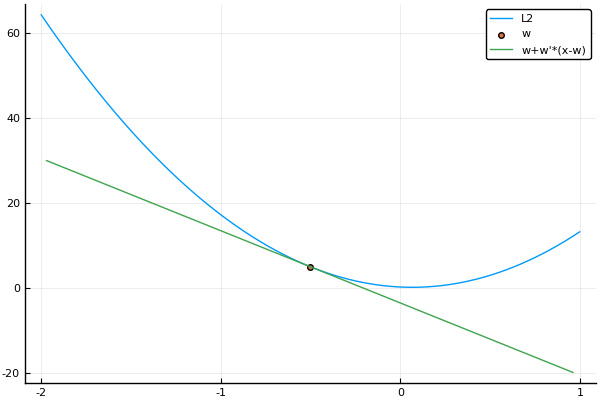
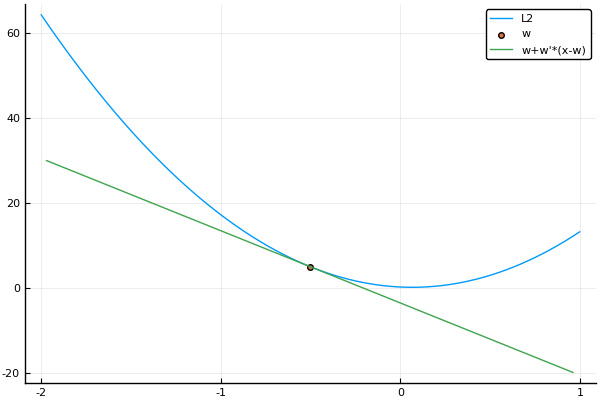

In [17]:
@manipulate for w in -2:0.01:1
    plot(w->L2(w, 0.3), -2:0.01:1, label="L2")
    scatter!([w], [L2(w, 0.3)], label="w")
    plot!(x->(L2(w, 0.3) + partial_w(L2, w, 0.3, 0.001) * (x-w)), -2, 1, label="w+w'*(x-w)")
end

## ***Optional**: Functions with $n$ inputs

If a function $f$ takes $n$ input arguments, we can write them as $p_1, \ldots, p_n$, where $p_i$ means the "$i$th parameter". In Julia, we can wrap them up into a single **vector**. Now we can calculate the partial derivative $\frac{\partial L_2}{\partial p_i}$ with respect to the $i$th variable.

#### Exercise 14

For the next exercise, you will need to use the splat command, `...`. You can use this command to "open up" a collection and pass all the elements of that collection as inputs to a function.

For example, say you have an array, `numbers`,

```julia
numbers = [4, 3, 2]
```

and you want to use `numbers` to create a $4\times3\times3$ randomly populated array via `rand`. `rand(numbers)` will not do what you want. You could index into `numbers` to grab the values you want and pass them to `rand`, as in

```julia
rand(numbers[1], numbers[2], numbers[3])
```

or you could use a splat:

```julia
rand(numbers...)
```

Use `...` to pass the contents of `inputs`

```julia
inputs = [30, 12, "cats"]
```

to the function `dreams`

```julia
dreams(i, j, perfect_mammal) = "I wish I had $(i + j) $perfect_mammal."
```

In [18]:
dreams(i, j, perfect_mammal) = "I wish I had $(i + j) $perfect_mammal."
inputs = [30, 12, "cats"]
dreams(inputs...)

"I wish I had 42 cats."

#### Exercise 15:

Write a function, `partial`, to calculate the $i$th partial derivative of a function. This function should have four inputs

* a function, $f$, for which you want to compute the partial derivative
* an array, *p*, specifying the values of all input arguments to $f$ at the point where you want $\frac{\partial f}{\partial p_i}$ computed
* the index, $i$, of the variable with respect to which you want to calculate the partial derivative of $f$
* a step size with default value 0.001

Hint: you will need to `copy` and modify `p` within `partial`.

In [19]:
function partial(f::Function, p, i, h=0.001)
    p_h = copy(p)
    p_h[i] += h
    partial_p =  ((f(p_h...) - f(p...))/h)
    return partial_p
end

partial (generic function with 2 methods)

In [20]:
partial(L2, [-2.0, 0], 2)

0.20400000001075114

## Gradient descent in 2 dimensions

It turns out that the gradient vector of the function $L_2(w, b)$ gives the direction in the plane $(w, b)$ in which the function $L_2$ **increases fastest**. 

In other words, if you start at the position $(w_0, b_0)$ and take a small step of length $\eta$ to new values $(w', b')$, the value of the function will change to a new value $L_2(w', b')$. How do we get to the minimum of $L_2(w, b)$ as fast as possible? We want to step in the direction where $L_2$ decreases fastest!

In multivariable calculus courses, it is shown that $L_2$ will *increase* fastest if you take a step **in the direction of the gradient $\nabla L_2(w, b)$**! To decrease $L_2$ the fastest, we should take a step in the *opposite* direction, $-\nabla L_2(w, b)$.

Let's now generalize the gradient descent algorithm that we wrote previously to work our 2-dimensional function.

#### Exercise 16

Extend your 1D implementation of `gradient_descent` so that it will minimize the function $L_2$.

Requirements:

* Your new method for `gradient_descent` will take four input arguments: the function $f$ for which you seek the minimum, the range of values for $f$'s first input argument that you will consider, the range of values for $f$'s second input argument that you will consider, and a tolerance that will specify the maximum allowable step size, $\sum_i \eta \frac{\partial f}{\partial p_i}$

* Use $\eta = .01$. For example, for a function $f(w, b)$, update $w$ such that $w_{n+1} = w_n - 0.01 * \frac{\partial f}{\partial w_n}$

* Seed `gradient_descent` with the starting coordinates [-2.0, -2.0], i.e. $w_0 = -2.0$ and $b_0 = -2.0$.

* Return all steps (their coordinates) taken during gradient descent and the values of the loss function at these coordinates.

Once you have done this, execute

```julia
gradient_descent(L2, -2:0.02:2, -2:0.02:2, .001)
```

How many steps were taken by gradient descent? 

Hint: Do not count your starting coordinates `[-2.0, -2.0]` as a step.

In [21]:
function gradient_descent(L2::Function, w, b, tolerance = 0.001)
    w = -2.0
    b = -2.0 
    η = .01
    for iter in 1:2000
        w = w - η * partial(L2, [w, b], 1) 
        b = b - η * partial(L2, [w, b], 2)
        if iter % 100 == 0 
            println("$iter, $w, $b, $(L2(w, b)), $(partial(L2, [w, b], 1)), $(partial(L2, [w, b], 2))")
        end
        if  abs(η * partial(L2, [w, b], 1)) < tolerance && abs(η * partial(L2, [w, b], 2)) < tolerance
            println("$iter, $w, $b, $(L2(w, b)), $(partial(L2, [w, b], 1)), $(partial(L2, [w, b], 2))")
            return w, b, L2(w, b), partial(L2, [w, b], 1), partial(L2, [w, b], 2)
        end
    end
    return w, b, L2(w, b), partial(L2, [w, b], 1), partial(L2, [w, b], 2)
end

gradient_descent(L2, -2:0.02:2, -2:0.02:2, .00001)   

100, 0.07905114155742796, 0.49353151996914435, 0.053909855375788907, -0.0005287932154443564, -0.005850123361662851
122, 0.07910742623049857, 0.4941553319437916, 0.05390437058071394, -8.787697262924166e-5, -0.0009721969106979422


(0.07910742623049857, 0.4941553319437916, 0.05390437058071394, -8.787697262924166e-5, -0.0009721969106979422)

#### Exercise 17

Use the `surface` and `scatter!` commands to illustrate the path taken by `gradient_descent` from [-2.0, -2.0] to wherever the algorithm terminates. 

Where do the scattered points representing the steps of gradient descent appear the most dense?

A) Near the starting point at [-2.0, -2.0]<br>
B) Near the point [-1.8, 0] where $C_2$ appears nearly flat<br>
C) Near the minimum of $C_2$

In [22]:
function gradient_descent(f::Function, w, tol)
    η = 0.01
    f_dev(w) = (f(w + η) - f(w)) / η
    w = -2.0
    iter_result = [0.0 w f(w) f_dev(w);]
    for iter in 1:20000 
        w = w - f_dev(w) * η 
        iter_result = vcat(iter_result, [iter w f(w) f_dev(w)])
        if abs(f_dev(w) * η) < tol
            println("$iter, $w, $(f(w)), $(f_dev(w))")
            return iter_result
        end
        if iter % 1000 == 0 
            println("$iter, $w, $(f(w)), $(f_dev(w))")
        end
    end
    return iter_result
end

iter_result = gradient_descent(L1, -2:0.01:1.5, .000001) 

1000, -0.41262908586996394, 0.24537297247993448, -0.4195599164686675
2000, 0.6348391785897624, 0.0003729655881599626, -0.011992475709032384
3000, 0.6818349643558261, 1.3282307981836978e-5, -0.0013105706482745552
4000, 0.6873557047933837, 3.4585352143129194e-6, -0.00016540057237256342
4245, 0.6876744116411301, 3.087182639320568e-6, -9.997946485321435e-5


4246×4 Array{Float64,2}:
    0.0  -2.0       0.611546    -0.0557731  
    1.0  -1.99944   0.611515    -0.0558317  
    2.0  -1.99888   0.611484    -0.0558904  
    3.0  -1.99833   0.611453    -0.0559492  
    4.0  -1.99777   0.611422    -0.0560081  
    5.0  -1.99721   0.611391    -0.0560671  
    6.0  -1.99664   0.61136     -0.0561263  
    7.0  -1.99608   0.611328    -0.0561856  
    8.0  -1.99552   0.611297    -0.056245   
    9.0  -1.99496   0.611266    -0.0563045  
   10.0  -1.9944    0.611234    -0.0563642  
   11.0  -1.99383   0.611203    -0.0564239  
   12.0  -1.99327   0.611171    -0.0564838  
    ⋮                                       
 4234.0   0.687663  3.0998e-6   -0.000102264
 4235.0   0.687664  3.09864e-6  -0.000102054
 4236.0   0.687665  3.09748e-6  -0.000101845
 4237.0   0.687666  3.09633e-6  -0.000101636
 4238.0   0.687667  3.09517e-6  -0.000101427
 4239.0   0.687668  3.09403e-6  -0.000101219
 4240.0   0.687669  3.09288e-6  -0.000101011
 4241.0   0.68767   3.09173e-6

In [23]:
function gradient_descent(L2::Function, w, b, tolerance = 0.001)
    w = -2.0
    b = -2.0 
    η = .01
    iter_result = [0.0 w b L2(w,b) partial(L2, [w, b], 1) partial(L2, [w, b], 2)]
    for iter in 1:2000
        w = w - η * partial(L2, [w, b], 1) 
        b = b - η * partial(L2, [w, b], 2)
        iter_result = vcat(iter_result, [iter w b L2(w,b) partial(L2, [w, b], 1) partial(L2, [w, b], 2)])
        if iter % 100 == 0 
            println("$iter, $w, $b, $(L2(w, b)), $(partial(L2, [w, b], 1)), $(partial(L2, [w, b], 2))")
        end
        if  abs(η * partial(L2, [w, b], 1)) < tolerance && abs(η * partial(L2, [w, b], 2)) < tolerance
            println("$iter, $w, $b, $(L2(w, b)), $(partial(L2, [w, b], 1)), $(partial(L2, [w, b], 2))")
            return iter_result
        end
    end
    return iter_result #w, b, L2(w, b), partial(L2, [w, b], 1), partial(L2, [w, b], 2)
end

iter_result = gradient_descent(L2, -2:0.02:2, -2:0.02:2, .00001)   


100, 0.07905114155742796, 0.49353151996914435, 0.053909855375788907, -0.0005287932154443564, -0.005850123361662851
122, 0.07910742623049857, 0.4941553319437916, 0.05390437058071394, -8.787697262924166e-5, -0.0009721969106979422


123×6 Array{Float64,2}:
   0.0  -2.0        -2.0       79.45       -57.385        -15.796      
   1.0  -1.42615    -1.83056   48.6938     -40.5084       -15.5882     
   2.0  -1.02107    -1.66658   32.1577     -28.6838       -15.0865     
   3.0  -0.734228   -1.50998   22.805      -20.3919       -14.4074     
   4.0  -0.530309   -1.36183   17.1597     -14.5706       -13.63       
   5.0  -0.384603   -1.22261   13.4918     -10.4779       -12.8077     
   6.0  -0.279824   -1.09244   10.9299      -7.59485      -11.9759     
   7.0  -0.203876   -0.971161   9.02595     -5.55895      -11.1575     
   8.0  -0.148286   -0.858474   7.54295     -4.11664      -10.3672     
   9.0  -0.10712    -0.753979   6.34961     -3.09064       -9.61359    
  10.0  -0.0762135  -0.657225   5.36888     -2.35696       -8.90137    
  11.0  -0.0526439  -0.56774    4.55222     -1.82884       -8.23263    
  12.0  -0.0343555  -0.485048   3.86674     -1.44557       -7.60767    
   ⋮                                    

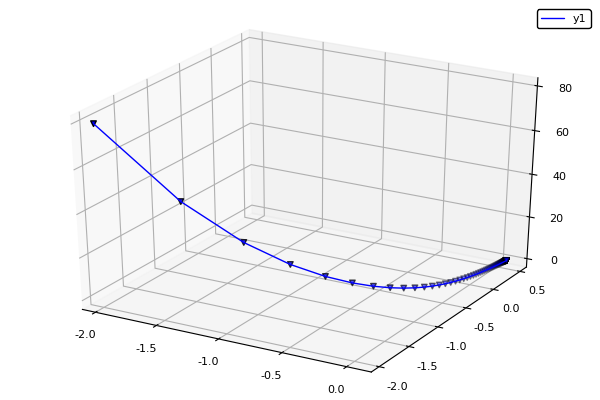

In [24]:
surface(-2:0.1:1.5, -2:0.1:2, L2, xlabel="w", ylabel="b")
plot3d(iter_result[:,2], iter_result[:,3], iter_result[:,4], marker=:v, color="blue")

## What we have learnt

To recap, in this notebook, we have seen that the computer can calculate approximate derivatives, and that we can use those inside a relatively simple algorithm, gradient descent, to minimize functions of 1 and 2 variables!

Now that we've used gradient descent to **learn** the best values of `b` and `w` for a cost function, we can imagine how we could do our classification of apples vs. bananas by allowing the machine to choose our parameters! To do this, we need to define a loss function for apple vs. banana classification, using images that have already been categorised as apples or bananas.